doodh
lala


In [83]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.metrics import roc_auc_score, make_scorer
import os
from sklearn import metrics
import seaborn as seabornInstance 
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
# load dataset
from keras import models    
from keras.models import load_model

from sklearn.linear_model import LinearRegression
import pandas as pd
from fancyimpute import KNN
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from random import randrange, uniform

NameError: name 'sample_matrix' is not defined

matrix([[ 41.],
        [152.]])

,age,gender,Income
0,1,male,12
1,2,female,23
2,3,M,34


,age,gender_vi,Income_vi
0,1,male,12
1,2,female,23
2,3,M,34


ModuleNotFoundError: No module named 'ggplot'

In [3]:
os.chdir("/Users/chandan/desktop/eduWork_project/")

In [ ]:
pd.options.display.float_format = '{:,.2f}'.format

In [12]:
data = pd.read_csv("train.csv")

In [25]:
data

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [26]:
data.shape
data.describe()


,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [27]:
data_vis = data.head(100000)
data_vis

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,train_99995,0,7.5506,-2.1141,16.4580,8.7807,10.4580,1.9466,4.9651,17.2145,...,12.3250,5.2121,-0.6436,13.0322,14.5112,0.6285,-5.3202,8.9640,15.1972,12.9530
99996,train_99996,0,8.3028,-2.2482,9.0411,6.8954,12.7687,3.3677,4.6836,20.6244,...,-1.8195,6.9932,2.3224,7.7880,20.7206,1.0374,7.1345,9.6374,14.3243,-0.0740
99997,train_99997,0,11.6311,3.4519,9.8680,9.1983,9.4670,-10.7162,5.4823,15.1234,...,0.8846,6.1457,4.3616,-2.1144,20.6248,-1.7600,-1.6696,9.3789,21.0496,2.3705
99998,train_99998,0,9.6262,-2.5826,16.5784,6.0817,13.4045,-15.0016,6.1913,21.2925,...,2.4406,11.0307,2.4303,2.5243,15.6526,0.3263,5.1957,9.7045,13.3582,-11.0003


In [28]:
plt.figure(figsize=(500,100))
sns.heatmap(data_vis.corr(),annot = True)
plt.show()

In [ ]:
sns.heatmap?

In [29]:
data_vis2 = data.tail(100000)
data_vis2

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
100000,train_100000,0,7.0987,-2.0057,8.0500,7.8754,13.2961,-10.2442,4.7920,17.5372,...,-4.2302,7.0876,4.2954,6.5649,18.0063,2.1031,12.1840,9.3047,16.3529,-6.0353
100001,train_100001,0,11.2321,0.8326,10.9387,7.4749,9.6369,-19.2275,6.1119,15.7646,...,0.2137,6.3294,0.1274,4.8939,17.6979,-2.3592,-0.7314,8.0394,19.8543,-5.5144
100002,train_100002,0,9.1928,2.8052,12.4876,8.5139,13.9320,-7.8300,4.6258,14.9243,...,-0.8494,3.9726,1.7904,7.1780,18.9760,0.0822,2.7941,7.7081,17.9709,-8.8970
100003,train_100003,1,12.0897,-4.7146,7.9690,7.3956,12.2021,-0.9740,4.7376,11.8356,...,7.0806,7.1884,2.2051,-2.2132,17.8242,-0.6447,5.2114,7.5871,18.0790,-0.6249
100004,train_100004,0,10.6317,6.5296,15.7351,7.0860,12.2669,-2.6239,5.6983,10.1488,...,3.8071,6.9106,0.3900,-1.0768,20.5909,0.3158,9.8406,9.1928,17.2329,4.4420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [31]:
plt.figure(figsize=(500,100))
sns.heatmap(data_vis2.corr(),annot = True)
plt.show()

In [ ]:
data.corr()

AttributeError: 'QuadMesh' object has no property 'xticketlabels'

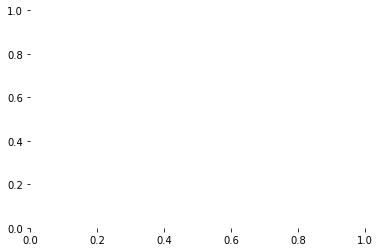

In [30]:
data.corr()
corr = data[:50].corr()
sns.heatmap(corr,
           xticketlabels = corr.columns,
           yticketlabels = corr.columns)


In [ ]:
#missing value present there would be
missing_val = pd.DataFrame(data.isnull().sum())
missing_val = missing_val.rename(columns = {'index': 'Variables', 0: 'Missing_percentage'})

#Calculate percentage
missing_val['Missing_percentage'] = (missing_val['Missing_percentage']/len(data))*100

#descending order
missing_val = missing_val.sort_values('Missing_percentage', ascending = False).reset_index(drop = True)

#save output results 
missing_val.to_csv("Miising_perc.csv", index = False)

In [ ]:
data['var_0'].loc[70] = np.nan

KeyboardInterrupt: 

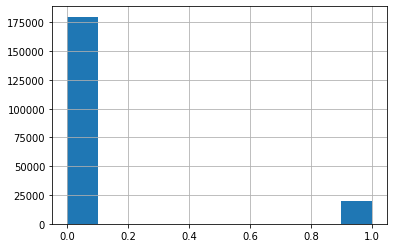

Error in callback <function flush_figures at 0x1a1a351598> (for post_execute):


KeyboardInterrupt: 

In [24]:
data["target"].hist()
sns.pairplot(data, hue = 'target',height = 3, aspect = 1)

pd.plotting.scatter_matrix(data,flagsize = (12,10))
plt.show()

In [ ]:
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [ ]:
#imputation method
#mean = 10.67991236556198
#median = 10.5247
#actual value = 8.5576
#knn = 

In [ ]:
data["var_0"] = data["var_0"].fillna(data["var_0"].median())

In [ ]:
data["var_0"].loc[70]

In [ ]:
lis = []
for i in range(0, data.shape[1]):
    #print(i)
    if(data.iloc[:,i].dtypes == 'object'):
        data.iloc[:,i] = pd.Categorical(data.iloc[:,i])
        #print(marketing_train[[i]])
        data.iloc[:,i] = data.iloc[:,i].cat.codes 
        data.iloc[:,i] = data.iloc[:,i].astype('object')
        
        lis.append(data.columns[i])
    

In [ ]:
for i in range(0, data.shape[1]):
    data.iloc[:,i] = data.iloc[:,i].replace(-1, np.nan) 

In [ ]:
data = pd.DataFrame(KNN(k = 3).fit_transform(data), columns = data.columns)


In [ ]:
list_data  = list(data1)
dataframe_now = pd.DataFrame(data1)

In [ ]:
for i in lis:
    data.loc[:,i] = data.loc[:,i].round()
    data.loc[:,i] = data.loc[:,i].astype('object')

In [ ]:
%matplotlib inline  
plt.boxplot(data)
#cnames =  ["var_0", "var_1", "var_3", "var_4", "var_5", "var_6", "var_7", "var_190",
#           "var_193", "var_195", "var_8"]
cnames = data_list 
cnames = data 
for i in cnames:
    print(i)
    q75, q25 = np.percentile(data.loc[:,i], [5 ,10])
    iqr = q75 - q25

    min = q25 - (iqr*1.5)
    max = q75 + (iqr*1.5)
    print(min)
    print(max)
    
    data = data.drop(data[data.loc[:,i] < min].index)
    data = data.drop(data[data.loc[:,i] > max].index)
    

In [ ]:
Extract quartiles
 q75, q25 = np.percentile(data['var_0'], [8 ,25])

 #Calculate IQR
 iqr = q75 - q25

 #Calculate inner and outer fence
 minimum = q25 - (iqr*1.5)
 maximum = q75 + (iqr*1.5)

# #Replace with NA
 data.loc[data['var_0'] < minimum,:'var_0'] = np.nan
 data.loc[data['var_0'] > maximum,:'var_0'] = np.nan

# #Calculate missing value
 missing_val = pd.DataFrame(data.isnull().sum())

# #Impute with KNN
 data = pd.DataFrame(KNN(k = 3).complete(data), columns = data.columns)

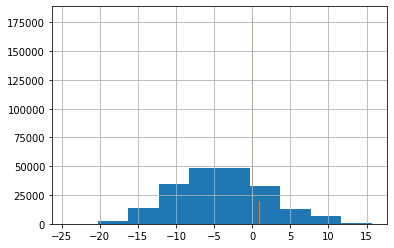

In [147]:
#data visualization
data['var_6'],data['var_110'],data['var_53'],data['var_26'].hist()
data['target'].hist()

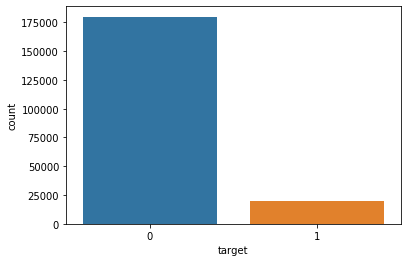

In [33]:
sns.countplot(x ='target',data = data)


In [32]:
#corr = data.corr() # df is the pandas dataframe
value = data[data.columns[1:]].corr()['target'][:]

value.sort_values(ascending = False)

target     1.000000
var_6      0.066731
var_110    0.064275
var_53     0.063399
var_26     0.062422
             ...   
var_76    -0.061917
var_146   -0.063644
var_12    -0.069489
var_139   -0.074080
var_81    -0.080917
Name: target, Length: 201, dtype: float64

In [63]:

#Decision tree
from sklearn import tree
from sklearn.model_selection import train_test_split

X = [data['var_6'],data['var_110'],data['var_53'],data['var_26']]

y = data['target']

X = np.asarray(X).transpose()

X_train, X_test, y_train, y_test = train_test_split(
    
    X, y, test_size=0.33, random_state=42)
#X_train = [data['var_6'],data['var_110'],data['var_53'],data['var_26']]
#Y_train = data['target']
#split
#X_train = np.asarray(X).transpose()
#Y
model = tree.DecisionTreeClassifier()

In [64]:
print(X_train)
print(y_train)

[[  4.8381   4.2416   6.6757  -7.7491]
 [  5.5449   7.3248   6.1623  -9.0584]
 [  4.901    3.9419   5.8249 -11.6446]
 ...
 [  5.2315  10.2464   6.2957  -3.9577]
 [  3.1534   5.8074   7.0765  -5.5393]
 [  4.2625   3.2183   5.2121  -7.2985]]
39290     0
105995    0
2423      0
64689     0
158534    1
         ..
119879    0
103694    0
131932    0
146867    0
121958    0
Name: target, Length: 134000, dtype: int64


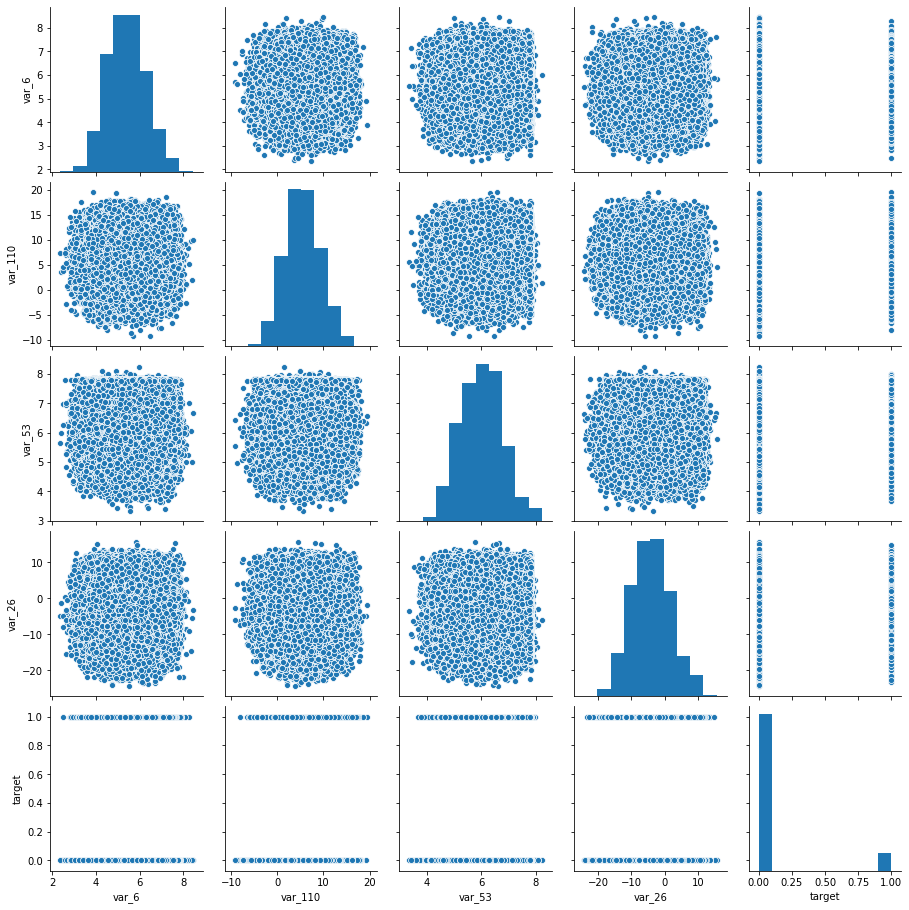

In [145]:
df1 = data[['var_6','var_110','var_53','var_26','target']]
sns.pairplot(df1)

In [50]:
data.plot(x = X, y = y, kind="bar")



ValueError: x must be a label or position

In [66]:
X = pd.DataFrame(X)
y = pd.DataFrame(y)


In [18]:
y_pred = model.predict(X_test)
y_correct_pred = y_pred-y_test
y_correct_pred = np.asarray(y_correct_pred)
failed_pred = np.count_nonzero(y_correct_pred)
acc = 100-failed_pred/len(y_correct_pred)*100
print(acc)

81.45151515151515


In [153]:
fpr,tpr,thresholds = roc_curve(y_test,y_correct_pred)

In [154]:
def plot_roc(fpr,tpr,label = None):
    plt.plot(fpr,tpr,linewidth=2,label = label)
    plt.plot([0,1],[0,1],'k--')
    plt.axis([0,1,0,1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    

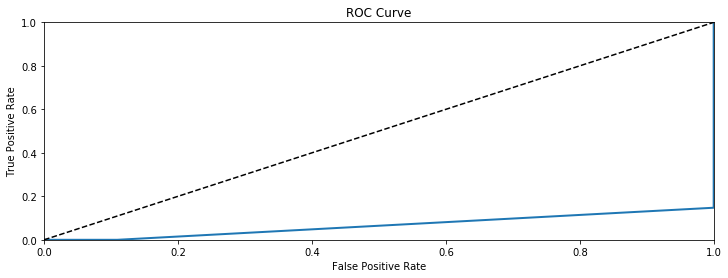

In [155]:
plt.figure(figsize = (12,4));
plot_roc(fpr,tpr)
plt.show();

In [97]:
y_pred_prob

array([[1., 1., 1., ..., 1., 1., 1.],
       [0., 0., 0., ..., 0., 0., 0.]])

ValueError: Found input variables with inconsistent numbers of samples: [1, 2]

In [19]:
#Random forest
from sklearn.ensemble import RandomForestClassifier

# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt')
# Fit on training data


In [128]:
 y_score = model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred.transpose()

array([0, 0, 0, ..., 0, 0, 0])

In [120]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred)

array([[59118,   128],
       [ 6687,    67]])

In [121]:
from sklearn.metrics import precision_score, recall_score

In [122]:
precision_score(y_test,y_pred)

0.3435897435897436

In [123]:
recall_score(y_test,y_pred)

0.009920047379330768

In [126]:
from sklearn.metrics import f1_score
f1_score(y_test,y_pred)

0.01928335012231976

In [130]:
fpr,tpr,thresholds = roc_curve(y_test,y_pred)

In [140]:
def plot_roc(fpr,tpr,label = None):
    plt.plot(fpr,tpr,linewidth=2,label = label)
    plt.plot([0,1],[0,1],'k--')
    plt.axis([0,1,0,1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    

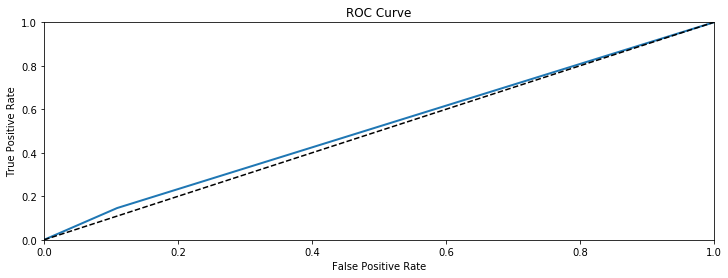

In [141]:
plt.figure(figsize = (12,4));
plot_roc(fpr,tpr)
plt.show();

In [21]:
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8967424242424242


In [22]:
#SVM classification
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear',C=0.001) # Linear Kernel

#Train the model using the training sets


In [ ]:
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred_svm = clf.predict(X_test)

In [148]:
fpr1,tpr1,thresholds1 = roc_curve(y_test,y_pred_svm)

In [151]:
def plot_roc(fpr1,tpr1,label = None):
    plt.plot(fpr1,tpr1,linewidth=2,label = label)
    plt.plot([0,1],[0,1],'k--')
    plt.axis([0,1,0,1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    

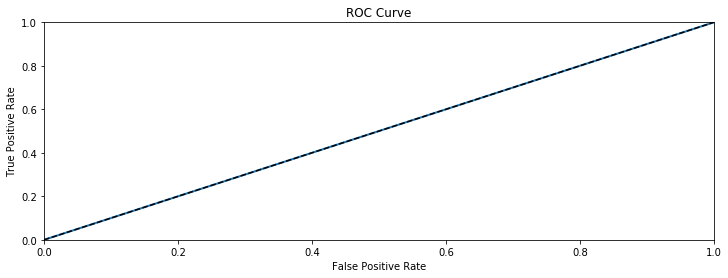

In [152]:
plt.figure(figsize = (12,4));
plot_roc(fpr1,tpr1)
plt.show();

In [23]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_svm))

Accuracy: 0.8976666666666666


In [81]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr,tpr,thresholds = roc_curve(y_test,logmodel.predict_proba(X_test))

NameError: name 'logmodel' is not defined

In [ ]:

#sns.pairplot(list_data);
#plt.show()

In [ ]:
# mail
\

In [ ]:
#
